## アファイン変換
- アファイン変換とは回転・平行移動などの線形変換

アファイン変換の公式
- 回転やせん断変形など　,平行移動
$$
\begin{pmatrix} x' \\ y' \end{pmatrix}=\begin{pmatrix} a & b \\ c & d \end{pmatrix}\begin{pmatrix} x \\ y \end{pmatrix}+\begin{pmatrix} t_x \\ t_y \end{pmatrix}
$$

- github では下記　↓　参照（gitで正しく表示されない為）

$\begin{pmatrix} x' \\ y' \end{pmatrix}$=$\begin{pmatrix} a & b \\ c & d \end{pmatrix}$*$\begin{pmatrix} x \\ y \end{pmatrix}$+$\begin{pmatrix} t_x \\ t_y \end{pmatrix}$

- 線形変換を纏めた行列
$$
\begin{pmatrix} x' \\ y' \\1 \end{pmatrix}=\begin{pmatrix} a & b & t_x \\ c & d & t_y \\0 & 0 & 1 \end{pmatrix}\begin{pmatrix} x \\ y \\1 \end{pmatrix}
$$

- github では下記　↓　参照（gitで正しく表示されない為）

$\begin{pmatrix} x' \\ y' \\1 \end{pmatrix}$=$\begin{pmatrix} a & b & t_x \\ c & d & t_y \\0 & 0 & 1 \end{pmatrix}$*$\begin{pmatrix} x \\ y \\1 \end{pmatrix}$

- 同次座標 -> 1 = (0 0 1)(1) 

- x, y, 以外の軸(同次座標)を導入する
    - 同次座標を導入することによって、変換行列だけでアファイン変換を記述する事ができる
    
#### Open CV では変換行列を定義してアファイン変換をしていく事になる


In [13]:
import cv2
import numpy as np

In [14]:
# 画像の読み込み -> 画像のsize取得 -> 移動距離の定義
img = cv2.imread("data/src/grapes.jpg")
h, w = img.shape[:2]
dx, dy = 30, 30

In [15]:
# 変換行列の定義 30pxづつ右斜め下にずらす
afn_mat = np.float32([[1,0,dx],[0,1,dy]])
img_afn = cv2.warpAffine(img, afn_mat, (w, h))

In [16]:
cv2.imshow("trans", img_afn)
cv2.waitKey(0)
cv2.destroyAllWindows()
cv2.waitKey(1)

2021-08-18 19:44:48.208 python3[11913:161257] _TIPropertyValueIsValid called with 4 on nil context!
2021-08-18 19:44:48.208 python3[11913:161257] imkxpc_getApplicationProperty:reply: called with incorrect property value 4, bailing.
2021-08-18 19:44:48.208 python3[11913:161257] Text input context does not respond to _valueForTIProperty:
2021-08-18 19:44:48.225 python3[11913:161257] _TIPropertyValueIsValid called with 4 on nil context!
2021-08-18 19:44:48.225 python3[11913:161257] imkxpc_getApplicationProperty:reply: called with incorrect property value 4, bailing.
2021-08-18 19:44:48.225 python3[11913:161257] Text input context does not respond to _valueForTIProperty:


-1

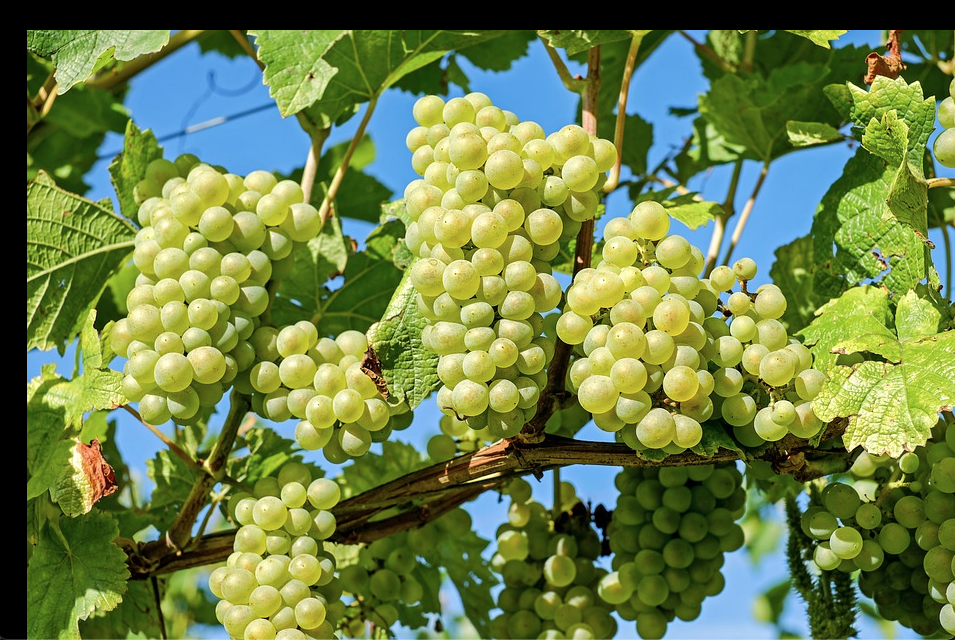

In [17]:
# 回転変換: getRotationMatrix2D 関数を使用することで簡単に回転を扱うことができる
rot_mat = cv2.getRotationMatrix2D((w/2, h/2), 40, 1)  # 回転させる場所(座標) : 回転させる角度 : 画像の拡大縮小(scale)
img_afn2 = cv2.warpAffine(img, rot_mat, (w, h))       # warpAffineを使用して変換行列を適用する : img(変換元) : 変換する matrix : 画像のsize（解像度） 

In [18]:
cv2.imshow("rotation", img_afn2)
cv2.waitKey(0)
cv2.destroyAllWindows()
cv2.waitKey(1)

2021-08-18 19:46:32.289 python3[11913:161257] IMKClient Stall detected, *please Report* your user scenario attaching a spindump (or sysdiagnose) that captures the problem - (imkxpc_dismissFunctionRowItemTextInputViewWithReply:) block performed very slowly (72.46 secs).
2021-08-18 19:46:32.289 python3[11913:161257] _TIPropertyValueIsValid called with 4 on nil context!
2021-08-18 19:46:32.289 python3[11913:161257] imkxpc_getApplicationProperty:reply: called with incorrect property value 4, bailing.
2021-08-18 19:46:32.289 python3[11913:161257] Text input context does not respond to _valueForTIProperty:
2021-08-18 19:46:32.290 python3[11913:161257] _TIPropertyValueIsValid called with 4 on nil context!
2021-08-18 19:46:32.290 python3[11913:161257] imkxpc_getApplicationProperty:reply: called with incorrect property value 4, bailing.
2021-08-18 19:46:32.290 python3[11913:161257] Text input context does not respond to _valueForTIProperty:
2021-08-18 19:46:32.290 python3[11913:161257] IMKClien

-1

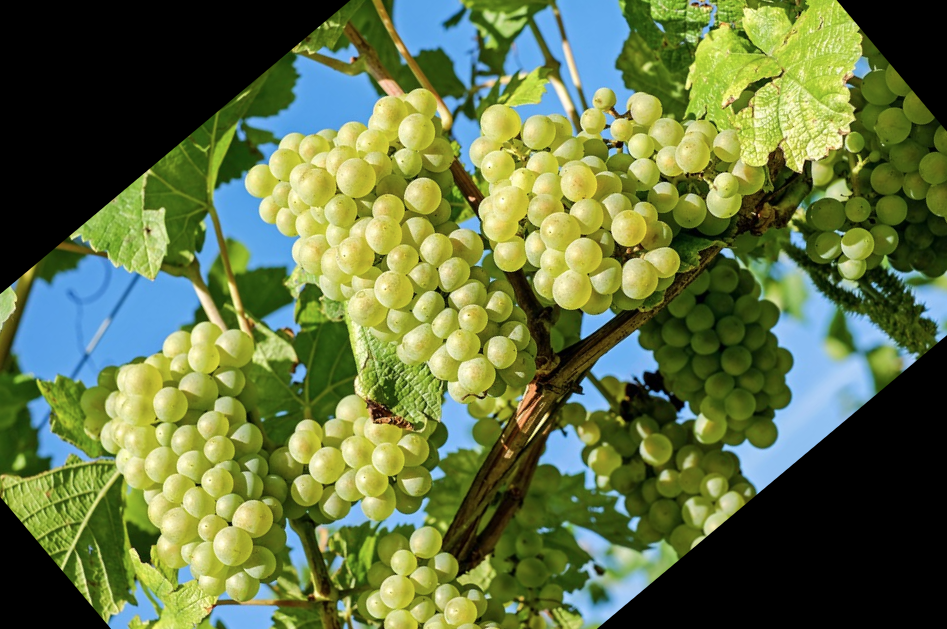

## 透視変換
- 透視変換を行うことで、奥行きある画像を描画(変換)する事ができる

In [19]:
import cv2
import numpy as np

In [25]:
img = cv2.imread("data/src/drive.jpg")
h, w = img.shape[:2]
cv2.imshow("img", img)
cv2.waitKey(0)
cv2.destroyAllWindows()
cv2.waitKey(1)

-1

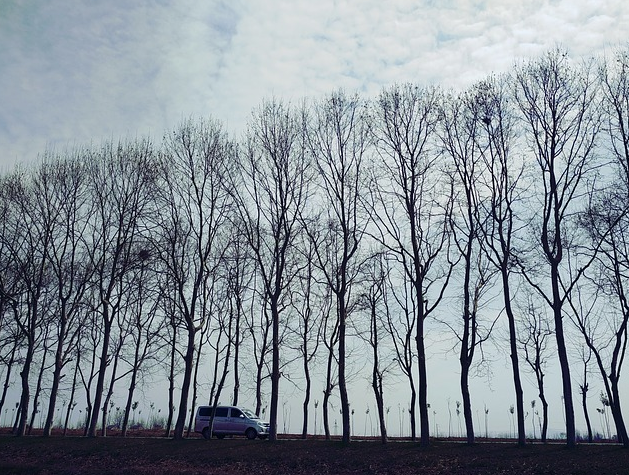

透視変換する場合には、左上の点、右上の点に対応させるように分布させる(交互に対応させる)

そうする事によって奥行き方向に分布したような画像になる

In [23]:
# 点の対応関係を作成する -> 下記の引数で指定する元の点は、対応関係をうまく調整しないと画像がおかしくなるので、あらかじめ試行錯誤した点の対応関係を使っている
per1 = np.float32([[100, 500], [300, 500], [300, 100], [100, 100]])
per2 = np.float32([[100, 500], [300, 500], [280, 200], [150, 200]])  # こちらの per2 は台形に点を対応させる。対応後の点の場所

psp_mat = cv2.getPerspectiveTransform(per1, per2) # 変換の行列を作成させる
img_psp = cv2.warpPerspective(img, psp_mat, (w, h))       # 作成した matrix を渡す -> 透視変換を行う事ができる

In [24]:
cv2.imshow("psp", img_psp)
cv2.waitKey(0)
cv2.destroyAllWindows()
cv2.waitKey(1)

-1

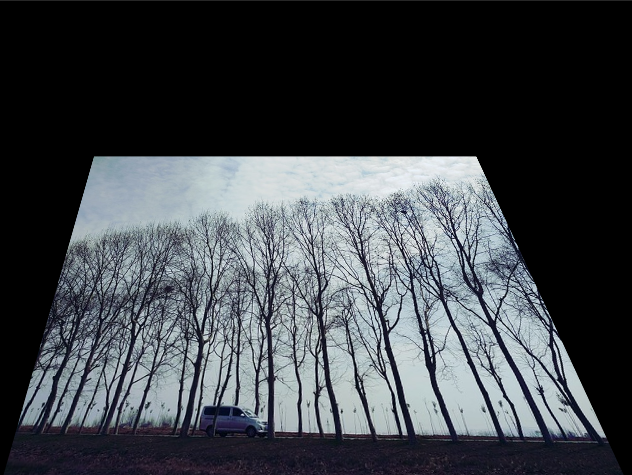

## 畳み込みの基礎

In [26]:
import cv2
import numpy as pn

kernel = np.ones((3,3)) / 9.0  # 3 * 3 の 1/9 のフィルターを用意する
kernel

array([[0.11111111, 0.11111111, 0.11111111],
       [0.11111111, 0.11111111, 0.11111111],
       [0.11111111, 0.11111111, 0.11111111]])

In [28]:
img = cv2.imread("data/src/Lena.jpg", 0)

# 畳み込んでいく
img_ke1 = cv2.filter2D(img, -1, kernel)  # ３つの引数を与える : 入力画像 : bit深度（負の値を与えておくと元の画像と同じものを返してくれる） : kernel

cv2.imshow("img", img_ke1)
cv2.imshow("src", img)
cv2.waitKey(0)
cv2.destroyAllWindows()
cv2.waitKey(1)

-1

src

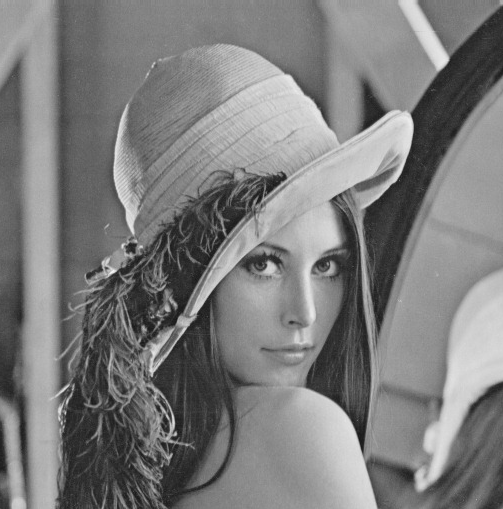

img

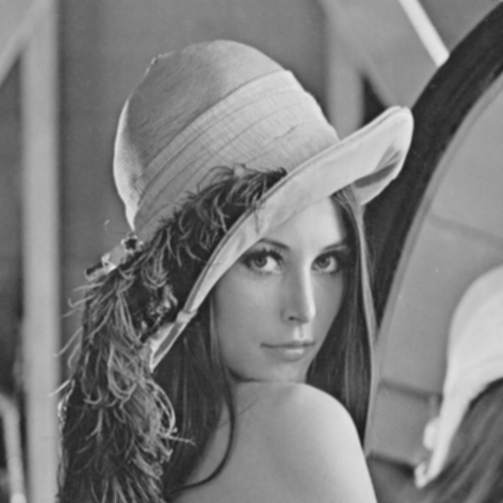

上記のようにフィルターを作成して、平滑化や微分ができる…

しかし、毎回フィルターを作成するのは手間なので<u>実際にはそれぞれに合ったフィルターを使用する事が多い</u>

### sobel フィルター

In [29]:
kernel2 = np.zeros((3, 3))
kernel2[0, 0] = 1
kernel2[1, 0] = 2
kernel2[2, 0] = 1
kernel2[0, -1] = -1
kernel2[1, 2] = -2
kernel2[2, 2] = -1

kernel2

array([[ 1.,  0., -1.],
       [ 2.,  0., -2.],
       [ 1.,  0., -1.]])

In [30]:
img_ke2 = cv2.filter2D(img, -1, kernel2)

cv2.imshow("img", img_ke2)
cv2.waitKey(0)
cv2.destroyAllWindows()
cv2.waitKey(1)

-1

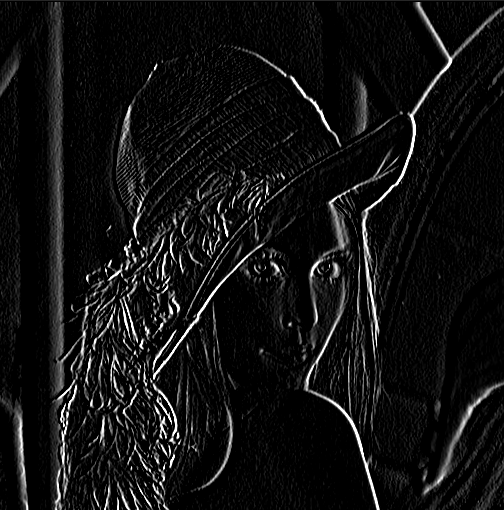

## 画像の平滑化
- 平滑化フィルターはいくつかの種類がある


In [53]:
import cv2

img = cv2.imread("data/src/buildings.jpg")

# 平滑化： もっとも単純な平滑化処理　：　画像のぼかし
img_blur = cv2.blur(img, (3, 3))  # ブラー処理：　1/9 3*3 と全く同じフィルター。引数を渡すだけで、フィルターを作らずに処理できる

cv2.imshow("img", img_blur)
cv2.imshow("src", img)
cv2.waitKey(0)
cv2.destroyAllWindows()
cv2.waitKey(1)

2021-08-18 00:32:17.388 python3[10992:234026] _TIPropertyValueIsValid called with 4 on nil context!
2021-08-18 00:32:17.388 python3[10992:234026] imkxpc_getApplicationProperty:reply: called with incorrect property value 4, bailing.
2021-08-18 00:32:17.388 python3[10992:234026] Text input context does not respond to _valueForTIProperty:
2021-08-18 00:32:17.388 python3[10992:234026] _TIPropertyValueIsValid called with 4 on nil context!
2021-08-18 00:32:17.388 python3[10992:234026] imkxpc_getApplicationProperty:reply: called with incorrect property value 4, bailing.
2021-08-18 00:32:17.388 python3[10992:234026] Text input context does not respond to _valueForTIProperty:


-1

In [54]:
# GaussianBlur : こちらも非常に有名な画像の blur（ぼかし）の処理 -> 強いぼかし、ぼかしの調整
img_ga = cv2.GaussianBlur(img, (9,9), 2)  # filter の枠の大きさ（奇数を与えてあげないとエラーが出てしまう　）：　　２の値が大きければ大きほど画像がぼやける


In [55]:
cv2.imshow("img", img_ga)
cv2.imshow("src", img)
cv2.waitKey(0)
cv2.destroyAllWindows()
cv2.waitKey(1)

2021-08-18 00:32:30.737 python3[10992:234026] IMKClient Stall detected, *please Report* your user scenario attaching a spindump (or sysdiagnose) that captures the problem - (imkxpc_dismissFunctionRowItemTextInputViewWithReply:) block performed very slowly (7.30 secs).
2021-08-18 00:32:30.737 python3[10992:234026] _TIPropertyValueIsValid called with 4 on nil context!
2021-08-18 00:32:30.737 python3[10992:234026] imkxpc_getApplicationProperty:reply: called with incorrect property value 4, bailing.
2021-08-18 00:32:30.737 python3[10992:234026] Text input context does not respond to _valueForTIProperty:
2021-08-18 00:32:30.737 python3[10992:234026] _TIPropertyValueIsValid called with 4 on nil context!
2021-08-18 00:32:30.737 python3[10992:234026] imkxpc_getApplicationProperty:reply: called with incorrect property value 4, bailing.
2021-08-18 00:32:30.737 python3[10992:234026] Text input context does not respond to _valueForTIProperty:
2021-08-18 00:32:30.737 python3[10992:234026] IMKClient

-1

In [56]:
# medianBlur フィルター : 5*5 で最も出てきた色で塗りつぶす（中央値） -> 色合いが少なくなるので、画像のタッチが油絵みたいになる
img_me = cv2.medianBlur(img, 5)  # 画像 : フィルターの大きさ :

In [57]:
cv2.imshow("img", img_me)
cv2.imshow("src", img)
cv2.waitKey(0)
cv2.destroyAllWindows()
cv2.waitKey(1)

-1

In [58]:
# bilateralFilter : 輝度変化のある部分は残しておいて、輝度変化がなだらかな所を平滑化する
img_by = cv2.bilateralFilter(img, 20, 30, 30)  # 画像 : window size : エッジを保存するためのシグマ : シグマ

In [59]:
cv2.imshow("img", img_by)
cv2.imshow("src", img)
cv2.waitKey(0)
cv2.destroyAllWindows()
cv2.waitKey(1)

2021-08-18 00:32:44.462 python3[10992:234026] _TIPropertyValueIsValid called with 4 on nil context!
2021-08-18 00:32:44.462 python3[10992:234026] imkxpc_getApplicationProperty:reply: called with incorrect property value 4, bailing.
2021-08-18 00:32:44.462 python3[10992:234026] Text input context does not respond to _valueForTIProperty:
2021-08-18 00:32:44.462 python3[10992:234026] _TIPropertyValueIsValid called with 4 on nil context!
2021-08-18 00:32:44.463 python3[10992:234026] imkxpc_getApplicationProperty:reply: called with incorrect property value 4, bailing.
2021-08-18 00:32:44.463 python3[10992:234026] Text input context does not respond to _valueForTIProperty:


-1

エッジを保存しながら、濃淡をなだらかに平滑化する

## 画像の微分
- 微分とは小さな区間の関数の変化
    - 曲線の傾き = X (微分係数)の求め方
$$
X = \frac{f(x+dx)-f(x)}{dx}
$$

- x 〜 x+dx における y の変化量 f(x+dx)

傾き = $\frac{y}{x}$ (yの変化量/xの変化量)


- 画像の微分も同じように考える事ができる
    - 画像処理での微分
    - 傾き　＝　隣の画素値 - 自分の画素値
- 画素値の場合は隣との距離 px は全て同じ距離(定数)になる
#### 画像を微分するとエッジが検出できる

## エッジの検出
- Sobel filter
- Laplacian filter

In [60]:
import cv2

In [61]:
img = cv2.imread("data/src/Lena.jpg", 0)
cv2.imshow("img", img)
cv2.waitKey(0)
cv2.destroyAllWindows()
cv2.waitKey(1)

2021-08-18 00:33:07.120 python3[10992:234026] IMKClient Stall detected, *please Report* your user scenario attaching a spindump (or sysdiagnose) that captures the problem - (imkxpc_dismissFunctionRowItemTextInputViewWithReply:) block performed very slowly (22.46 secs).
2021-08-18 00:33:07.120 python3[10992:234026] IMKClient Stall detected, *please Report* your user scenario attaching a spindump (or sysdiagnose) that captures the problem - (imkxpc_dismissFunctionRowItemTextInputViewWithReply:) block performed very slowly (14.21 secs).
2021-08-18 00:33:07.120 python3[10992:234026] _TIPropertyValueIsValid called with 4 on nil context!
2021-08-18 00:33:07.120 python3[10992:234026] imkxpc_getApplicationProperty:reply: called with incorrect property value 4, bailing.
2021-08-18 00:33:07.120 python3[10992:234026] Text input context does not respond to _valueForTIProperty:
2021-08-18 00:33:07.120 python3[10992:234026] _TIPropertyValueIsValid called with 4 on nil context!
2021-08-18 00:33:07.12

-1

### Sobel filter をかけていく

In [62]:
img_sobelx = cv2.Sobel(img, cv2.CV_32F, 1, 0, ksize=3)  # x 方向 : sobel は微分する方向を選ぶ事ができる
img_sobely = cv2.Sobel(img, cv2.CV_32F, 0, 1, ksize=3)  # y 方向 : 

In [63]:
img_sobelx

array([[   0.,   -4.,   -6., ...,  -72., -174.,    0.],
       [   0.,   -1.,   -5., ...,  -68., -176.,    0.],
       [   0.,    3.,   -5., ...,  -58., -169.,    0.],
       ...,
       [   0.,   31.,   14., ...,   -1.,  -12.,    0.],
       [   0.,   51.,   26., ...,    6.,    9.,    0.],
       [   0.,   58.,   28., ...,   10.,   20.,    0.]], dtype=float32)

In [64]:
# 正の値も負の値も入っているので修正する ：　0~256 段階に変換
img_sobelx = cv2.convertScaleAbs(img_sobelx)
img_sobely = cv2.convertScaleAbs(img_sobely)

In [65]:
img_sobelx

array([[  0,   4,   6, ...,  72, 174,   0],
       [  0,   1,   5, ...,  68, 176,   0],
       [  0,   3,   5, ...,  58, 169,   0],
       ...,
       [  0,  31,  14, ...,   1,  12,   0],
       [  0,  51,  26, ...,   6,   9,   0],
       [  0,  58,  28, ...,  10,  20,   0]], dtype=uint8)

In [66]:
cv2.imshow("x", img_sobelx)
cv2.imshow("y", img_sobely)
cv2.waitKey(0)
cv2.destroyAllWindows()
cv2.waitKey(1)

-1

x 方向　-> 水平方向に微分 -> それと垂直な方向(垂直)方向にエッジが検出されやすい

y 方向 -> 垂直方向に微分 -> それと垂直な方向(垂直)方向にエッジが検出されやすい

#### Laplacian filter をかける

In [67]:
img_lap = cv2.Laplacian(img, cv2.CV_32F)  # 方向がないので、画像と bit深度だけ

In [68]:
img_lap = cv2.convertScaleAbs(img_lap)  # 　絶対値に変換する : 0~256 段階に変換

In [69]:
# もっとエッジをハッキリさせたい場合
img_lap *= 2  # ２倍するという指示

In [70]:
cv2.imshow("lap", img_lap)
cv2.waitKey(0)
cv2.destroyAllWindows()
cv2.waitKey(1)

2021-08-18 00:33:42.106 python3[10992:234026] _TIPropertyValueIsValid called with 4 on nil context!
2021-08-18 00:33:42.106 python3[10992:234026] imkxpc_getApplicationProperty:reply: called with incorrect property value 4, bailing.
2021-08-18 00:33:42.106 python3[10992:234026] Text input context does not respond to _valueForTIProperty:
2021-08-18 00:33:42.120 python3[10992:234026] _TIPropertyValueIsValid called with 4 on nil context!
2021-08-18 00:33:42.120 python3[10992:234026] imkxpc_getApplicationProperty:reply: called with incorrect property value 4, bailing.
2021-08-18 00:33:42.120 python3[10992:234026] Text input context does not respond to _valueForTIProperty:


-1

- Laplacian は方向がないので全てのエッジが均一に検出されている
- 2次の微分なので値そのものが弱い。メリハリがないということ
- その場合は img_lap *= 2 を２倍にする。しかし一緒にノイズも載ってしまう
    - Gaussianそこで Laplacian Gaussian の出番

###  Laplacian Gaussian filter をかける

In [71]:
img_blur = cv2.GaussianBlur(img, (3, 3), 2)
img_lap2 = cv2.Laplacian(img_blur, cv2.CV_32F)
img_lap2 = cv2.convertScaleAbs(img_lap2)

# もっとエッジをハッキリさせたい場合
img_lap2 *= 2  # ２倍するという指示

cv2.imshow("lap2", img_lap2)
cv2.waitKey(0)
cv2.destroyAllWindows()
cv2.waitKey(1)

2021-08-18 00:34:08.842 python3[10992:234026] IMKClient Stall detected, *please Report* your user scenario attaching a spindump (or sysdiagnose) that captures the problem - (imkxpc_dismissFunctionRowItemTextInputViewWithReply:) block performed very slowly (26.52 secs).
2021-08-18 00:34:08.842 python3[10992:234026] IMKClient Stall detected, *please Report* your user scenario attaching a spindump (or sysdiagnose) that captures the problem - (imkxpc_dismissFunctionRowItemTextInputViewWithReply:) block performed very slowly (9.88 secs).
2021-08-18 00:34:08.842 python3[10992:234026] _TIPropertyValueIsValid called with 4 on nil context!
2021-08-18 00:34:08.842 python3[10992:234026] imkxpc_getApplicationProperty:reply: called with incorrect property value 4, bailing.
2021-08-18 00:34:08.842 python3[10992:234026] Text input context does not respond to _valueForTIProperty:
2021-08-18 00:34:08.842 python3[10992:234026] _TIPropertyValueIsValid called with 4 on nil context!
2021-08-18 00:34:08.842

-1

blru 処理によってノイスが消えている

#### Laplacian Gaussian の方がしっかりとエッジを検出する事ができる

## Canny(キャニー)
- Canny はノイズをうまく取り除き、エッジを検出する
- うまくエッジだけを残している。線画に近い

In [33]:
import cv2

img = cv2.imread("data/src/Lena.jpg", 0)

In [34]:
img_canny = cv2.Canny(img, 10, 100,)  # Canny 関数 : 画像 : 閾値、小、大(２段階設定)
cv2.imshow("Canny", img_canny)
cv2.waitKey(0)
cv2.destroyAllWindows()
cv2.waitKey(1)

-1

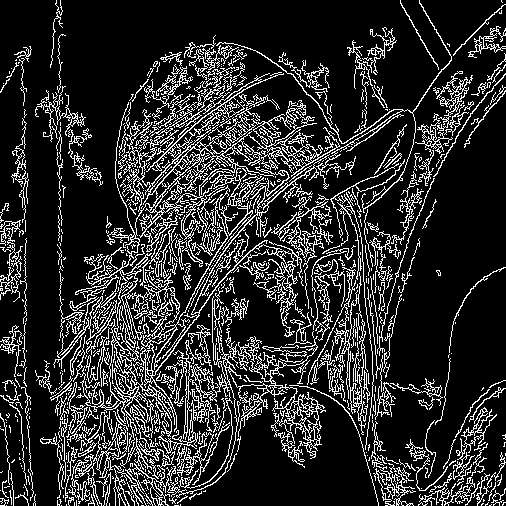

ノイズのようなものが入っているので、閾値を調整する

In [35]:
img_canny = cv2.Canny(img, 100, 200,)  # Canny 関数 : 画像 : 閾値、小、大(２段階設定)
cv2.imshow("Canny", img_canny)
cv2.waitKey(0)
cv2.destroyAllWindows()
cv2.waitKey(1)

-1

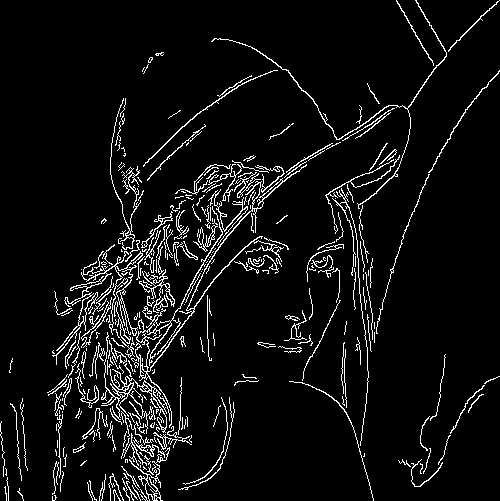

## 直線と円の検出

- <u>直線は２つのパラメーターによって決まる</u>

### 直線の公式
$$
y = ax + b
$$

#### a : 傾き, b : 切片

### 直線を表す別のパラメーター
- $\rho$(ロー) と $\theta$(シータ) を使って直線を表すこともできる

    - $\rho$ : 原点から直線までの最短距離
    - $\theta$ : x軸から直線までの角度

### $\rho$ と $\theta$ で表した直線
$$
y = -\frac{cos\theta}{sin\theta}x + \frac{\rho}{sin\theta}
$$


#### 全ての点の$\theta$ と $\rho$を集め、一番多かったパラメーターを直線とする
1. 画素のある点を探す
2. $\theta$を様々な値に設定し、$\rho$を計算
3. 全ての点に対して 1,2 を繰り返す
4. $\rho$と$\theta$の出現頻度を集計する
5. 出現頻度の最も多いものが直線

#### 直線を検出後の描画に関しての注意
- 下記の形式だと$\theta$ = 0 の時、極端に値が小さい時に分母の部分が発散してしまう：数（値の無限系列が、ある一定の有限値に定まらない）
$$
y = -\frac{cos\theta}{sin\theta}x + \frac{\rho}{sin\theta}
$$

- そこで出てくるのが<u>ベクトルを使用した方法</u>
$$
\overrightarrow{v(t)}=\overrightarrow{v_0}+t*\vec{v}
$$
$$
(x,y)=(x0+t*\sin\theta,y0-t*\cos\theta)
$$

#### ベクトル表示で直線の始点と終点を求める

### 直線の検出

In [36]:
import cv2
import numpy as np

In [37]:
img = cv2.imread("data/src/road.jpg")
img_g = cv2.imread("data/src/road.jpg", 0)
cv2.imshow("img", img)
cv2.waitKey(0)
cv2.destroyAllWindows()
cv2.waitKey(1)

-1

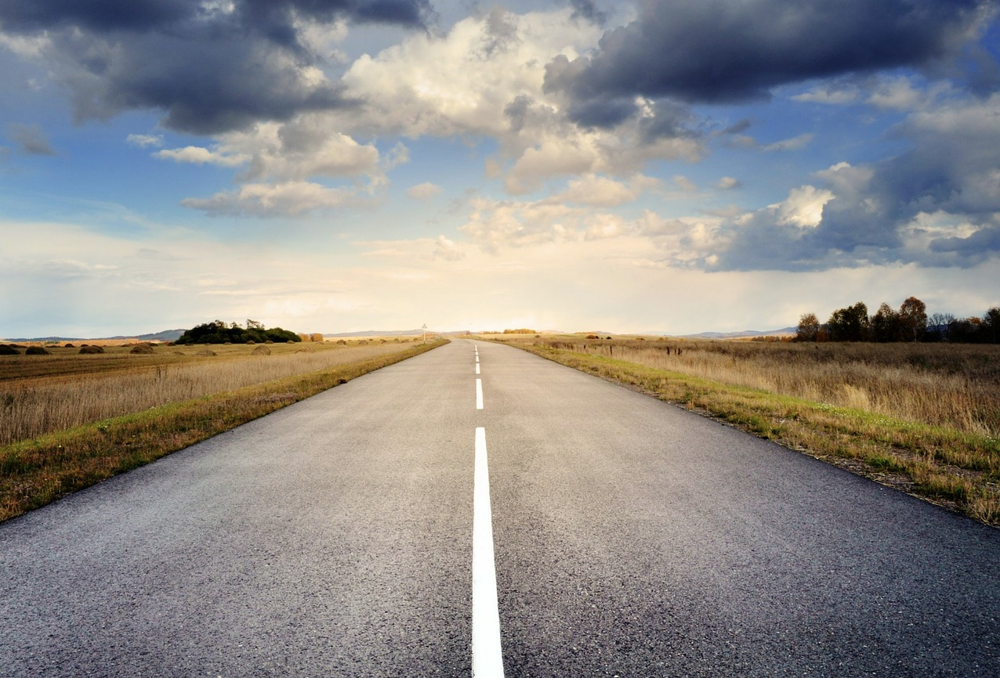

In [38]:
# 前処理として　Canny のエッジ検出を行う:少し閾値を高めの設定にしておく
img_canny = cv2.Canny(img_g, 300, 450)
cv2.imshow("img",img_canny)
cv2.waitKey(0)
cv2.destroyAllWindows()
cv2.waitKey(1)

-1

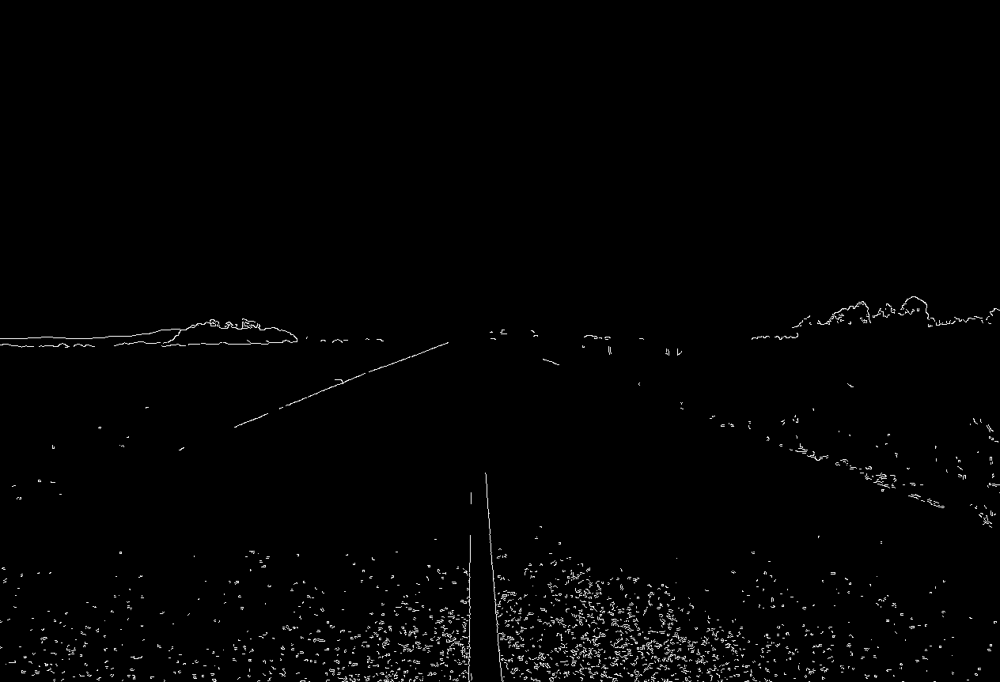

In [39]:
#　HoughLines 関数で直線を検出する
# 渡すパラメーター: 元画像 : rho(ロー)の刻み幅 : どれくらいの幅で theta（シータ）を回していくか : rho,theta の組みが100回以上現れるとlinesに蓄えられる
lines = cv2.HoughLines(img_canny, 1, np.pi/180, 100)

In [40]:
# rho と theta が蓄えられている。これを使用して直線を描く
lines

array([[[-5.8100000e+02,  3.0717795e+00]],

       [[-5.6700000e+02,  3.0543261e+00]],

       [[ 8.7500000e+02,  1.5707964e+00]],

       [[ 4.5400000e+02,  1.5358897e+00]],

       [[ 4.3700000e+02,  1.5533431e+00]],

       [[ 6.0400000e+02,  0.0000000e+00]],

       [[ 8.7900000e+02,  1.5184364e+00]],

       [[ 4.4800000e+02,  1.5533431e+00]],

       [[ 8.8000000e+02,  1.5009831e+00]],

       [[ 6.1700000e+02,  1.7453292e-02]],

       [[ 8.2900000e+02,  1.5707964e+00]],

       [[ 6.1900000e+02,  1.2042772e+00]],

       [[ 8.7300000e+02,  1.5533431e+00]],

       [[ 6.2400000e+02,  1.1868238e+00]],

       [[ 8.7000000e+02,  1.5358897e+00]],

       [[ 8.2600000e+02,  1.5707964e+00]],

       [[ 8.3900000e+02,  1.5882496e+00]],

       [[ 8.5400000e+02,  1.5533431e+00]],

       [[ 8.7800000e+02,  1.5533431e+00]],

       [[ 4.4400000e+02,  1.5707964e+00]],

       [[ 7.8000000e+02,  1.6406095e+00]],

       [[ 8.7600000e+02,  1.5533431e+00]],

       [[ 8.4500000e+02,  1.5707

In [41]:
# for文で上記の数を回して直線を描画させる
for i in lines[:]:
    # rho theta の順番で入っている
    rho = i[0][0]
    theta = i[0][1]
    # 見た目をスッキリさせる為
    a = np.cos(theta)
    b = np.sin(theta)
    # 原点
    x0 = rho * a
    y0 = rho * b
    # 始点と終点
    x1 = int(x0 + 1000 * (-b))
    y1 = int(y0 + 1000 * (a))
    x2 = int(x0 - 1000 * (-b))
    y2 = int(y0 - 1000 * (a))
    # line で描く / 画像 : 始点・終点 : color : 線の太さ
    cv2.line(img, (x1, y1), (x2, y2), (255, 0, 0), 1) 

cv2.imshow("img", img)
cv2.waitKey(0)
cv2.destroyAllWindows()
cv2.waitKey(1)

-1

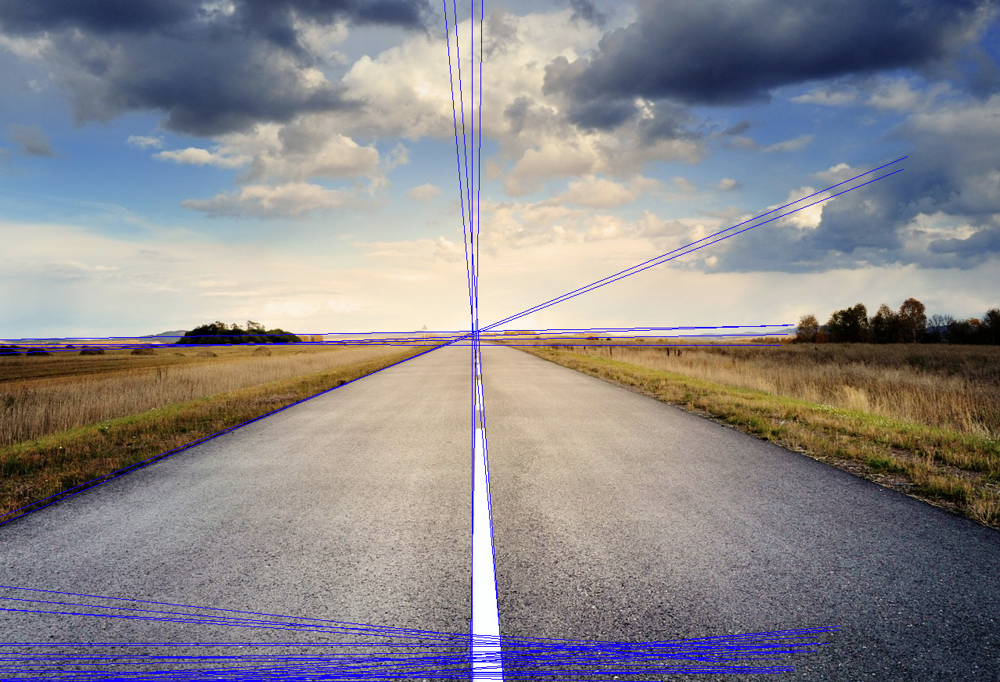

### 直線は検出できたが、ノイズのせいで直線では無いところも検出されてしまっている
- 直線検出は<u>ノイズに弱いというデメリットがある</u>

### 円の検出

In [42]:
img2 = cv2.imread("data/src/grapes.jpg")
img2_g = cv2.imread("data/src/grapes.jpg", 0)
cv2.imshow("img", img2_g)
cv2.waitKey(0)
cv2.destroyAllWindows()
cv2.waitKey(1)

-1

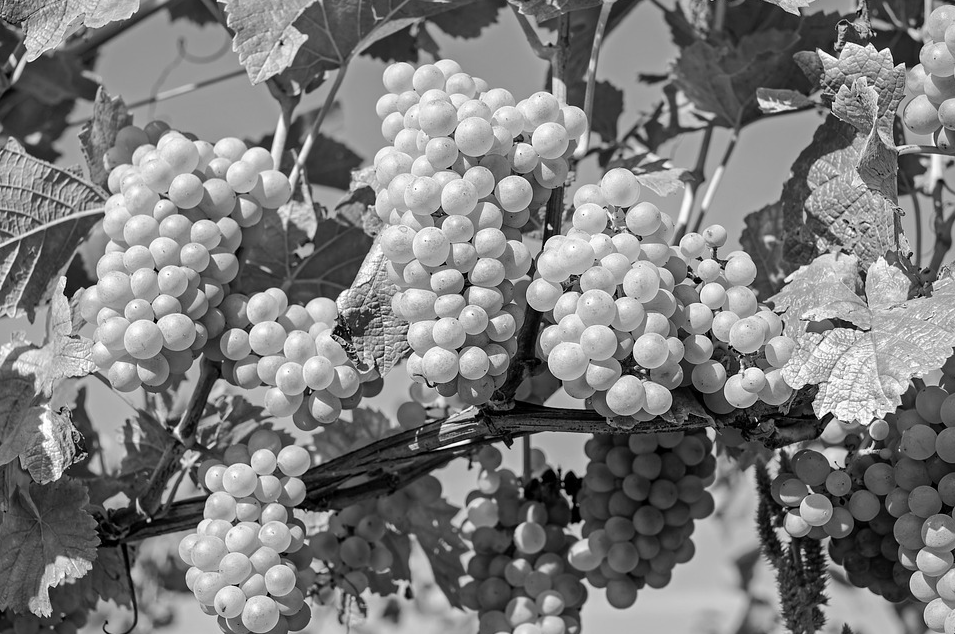

In [43]:
# HoughCircles 関数を用いて円を検出する / 
circles = cv2.HoughCircles?

Docstring:
HoughCircles(image, method, dp, minDist[, circles[, param1[, param2[, minRadius[, maxRadius]]]]]) -> circles
.   @brief Finds circles in a grayscale image using the Hough transform.
.   
.   The function finds circles in a grayscale image using a modification of the Hough transform.
.   
.   Example: :
.   @include snippets/imgproc_HoughLinesCircles.cpp
.   
.   @note Usually the function detects the centers of circles well. However, it may fail to find correct
.   radii. You can assist to the function by specifying the radius range ( minRadius and maxRadius ) if
.   you know it. Or, in the case of #HOUGH_GRADIENT method you may set maxRadius to a negative number
.   to return centers only without radius search, and find the correct radius using an additional procedure.
.   
.   It also helps to smooth image a bit unless it's already soft. For example,
.   GaussianBlur() with 7x7 kernel and 1.5x1.5 sigma or similar blurring may help.
.   
.   @param image 8-bit, single-chann

- ? で使用できるパラメーターを確認することができる
- shift + tab でも確認ができる

HoughCircles(image, method, dp, minDist[, circles[, param1[, param2[, minRadius[, maxRadius]]]]])

    - dp -> 精度：　基本的には 1 を使用する
    - minDist -> 検出する際に円と円と中心以下の距離：　あまり大きいと円を見逃してしまう
    - param1,2 -> Canny のエッジを使用しているので、その設定
    - minRadius -> 検出する際の円の条件を設定する : これ以上の円は検出する。これ以下の円は検出しないなどの閾値

#### 上記の parameter を上手く設定してあげないとノイズだらけになってしまう

In [44]:
circles = cv2.HoughCircles(img2_g, cv2.HOUGH_GRADIENT, dp =1, minDist=1, param1=20, param2=35, minRadius=1, maxRadius=30)

In [45]:
circles

array([[[516.5, 196.5,  18.3],
        [256.5,  40.5,  21.7],
        [628.5, 397.5,  20.5],
        [462.5, 199.5,  18.2],
        [743.5, 393.5,  17.2],
        [532.5, 540.5,  16.1],
        [343.5, 386.5,  26. ],
        [324.5, 319.5,  19.4],
        [622.5, 189.5,  19.4],
        [282.5, 583.5,  16. ],
        [872.5, 293.5,  21.7],
        [553.5, 143.5,  18.3],
        [391.5, 274.5,  21.7],
        [930.5, 586.5,  18.3],
        [562.5, 345.5,  19.4],
        [755.5, 382.5,  12.7],
        [813.5, 472.5,  19.4],
        [463.5, 348.5,  21.6],
        [ 50.5,  36.5,  19.4],
        [856.5,  90.5,  19.4],
        [356.5, 556.5,  17.2],
        [565.5, 303.5,  21.7],
        [ 77.5, 363.5,  17.2],
        [253.5, 543.5,  21.6],
        [514.5, 262.5,  19.3],
        [783.5, 354.5,  16.1],
        [791.5, 491.5,  18.3],
        [226.5, 515.5,  17.2],
        [266.5, 449.5,  17.2],
        [319.5, 375.5,  17.2],
        [305.5, 300.5,  21.7],
        [181.5, 361.5,  21.7],
        

以前のバージョンだとPython側でfloat型の変数をinteger型に変換してくれていた

そして、その暗黙の型変換が行われなくなっている

- 添字0のシーケンスアイテムの型が間違っている。

#### 半径部分をint型に変換

In [46]:
for i in circles[0]:
    x = int(i[0])
    y = int(i[1])
    r = int(i[2])
    cv2.circle(img2, (x, y), r, (255, 0, 0), 1)
cv2.imshow("img",img2)
cv2.waitKey(0)
cv2.destroyAllWindows()
cv2.waitKey(1)

-1

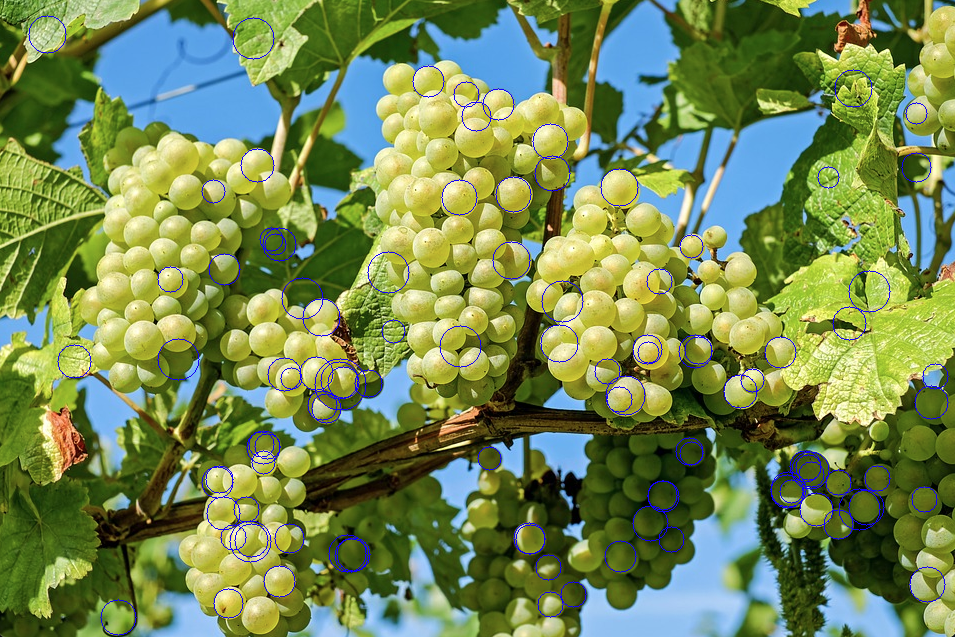

### 円は検出されるが、性能が劣る…
- 色々パラメーターを調整しないといけない手間もかかる
- ノイズがあると結構様々なところに円が検出されてしまう

## モルフォロジー演算
### モルフォロジー演算は膨張と収縮からなる
- モルフォロジー演算を使うことで、ものを分離したり、ノイズを消せる

#### モルフォロジー演算は膨張と収縮からなる
- erode(ヘロド) -> 収縮
  - ２つの図形が分離
  - 本来であれば、分離されているはずだがノイズで繋がってしまっている場合に使用する
- 元画像
  - ２つの図形を連結する細い線
- dilate(ディレーと) -> 膨張
  - ２つの図形がより一体化

In [47]:
import cv2
import numpy as np

In [48]:
img = cv2.imread("data/src/floor.jpg",)

In [49]:
# モルフォロジー演算をするためには、画像が２値化されている必要がある : 白か黒どちらかに分けるというように画像にメリハリをつける
ret, img_th = cv2.threshold(img, 110, 255, cv2.THRESH_BINARY)
cv2.imshow("img", img_th)
cv2.waitKey(0)
cv2.destroyAllWindows()
cv2.waitKey(1)

-1

#### 2値化

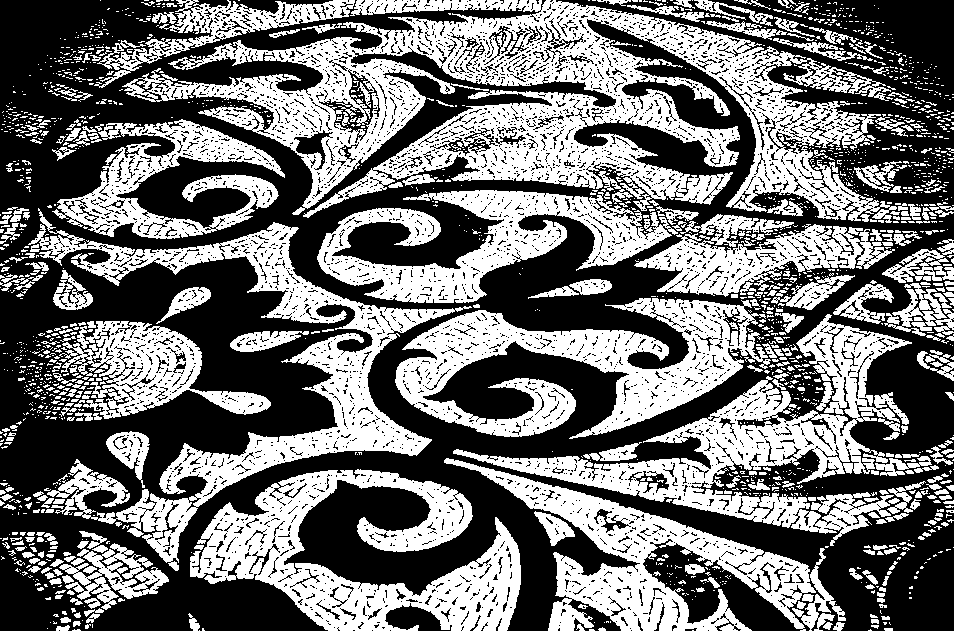

### モルフォロジー演算には kernel も必要になってくる
- 自分が中心となってその周り８近傍の着目画素を黒にするか、白にするか
- 例）
    - 白い画素があれば、膨張の場合着目画素も白にする
    - 黒い画素があれば、収縮の場合着目画素も黒くする
    
#### どの領域で探すかが　kernel(カーネル)

In [50]:
# モルフォロジー演算には kernel も必要になってくる -> 膨張した画像・収縮した画像を作成
kernel = np.ones((3, 3), dtype=np.uint8)
img_d = cv2.dilate(img_th, kernel)  # 膨張
img_e = cv2.erode(img_th, kernel)   # 収縮

In [52]:
cv2.imshow("img", img_th)
cv2.imshow("d", img_d)
cv2.imshow("e", img_e)
cv2.waitKey(0)
cv2.destroyAllWindows()
cv2.waitKey(1)

2021-08-18 20:05:15.673 python3[11913:161257] IMKClient Stall detected, *please Report* your user scenario attaching a spindump (or sysdiagnose) that captures the problem - (imkxpc_dismissFunctionRowItemTextInputViewWithReply:) block performed very slowly (27.30 secs).
2021-08-18 20:05:15.673 python3[11913:161257] _TIPropertyValueIsValid called with 4 on nil context!
2021-08-18 20:05:15.673 python3[11913:161257] imkxpc_getApplicationProperty:reply: called with incorrect property value 4, bailing.
2021-08-18 20:05:15.673 python3[11913:161257] Text input context does not respond to _valueForTIProperty:
2021-08-18 20:05:15.673 python3[11913:161257] IMKClient Stall detected, *please Report* your user scenario attaching a spindump (or sysdiagnose) that captures the problem - (imkxpc_dismissFunctionRowItemTextInputViewWithReply:) block performed very slowly (23.79 secs).
2021-08-18 20:05:15.674 python3[11913:161257] IMKClient Stall detected, *please Report* your user scenario attaching a spi

-1

#### floor img

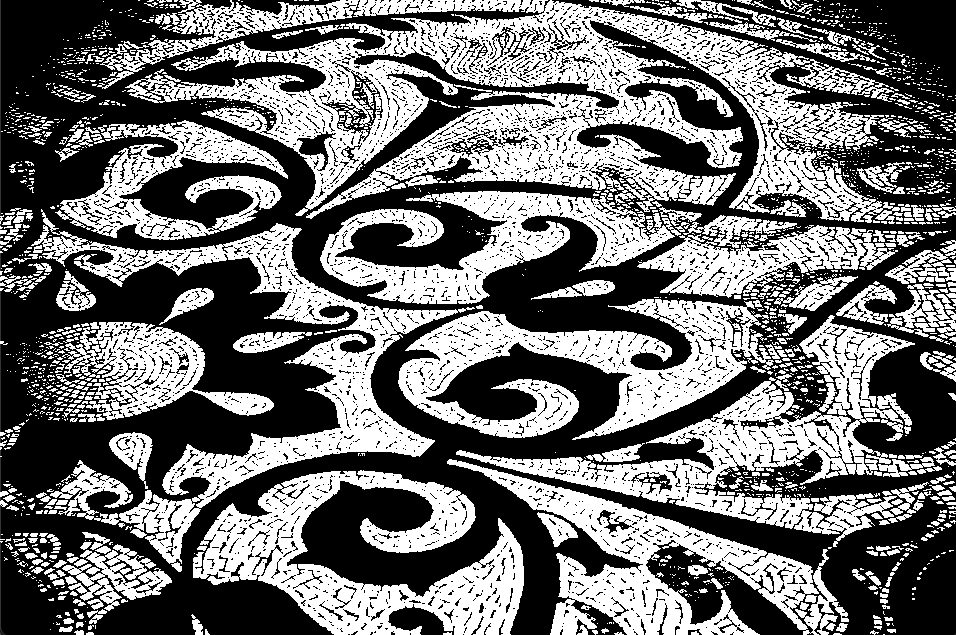

#### floor d

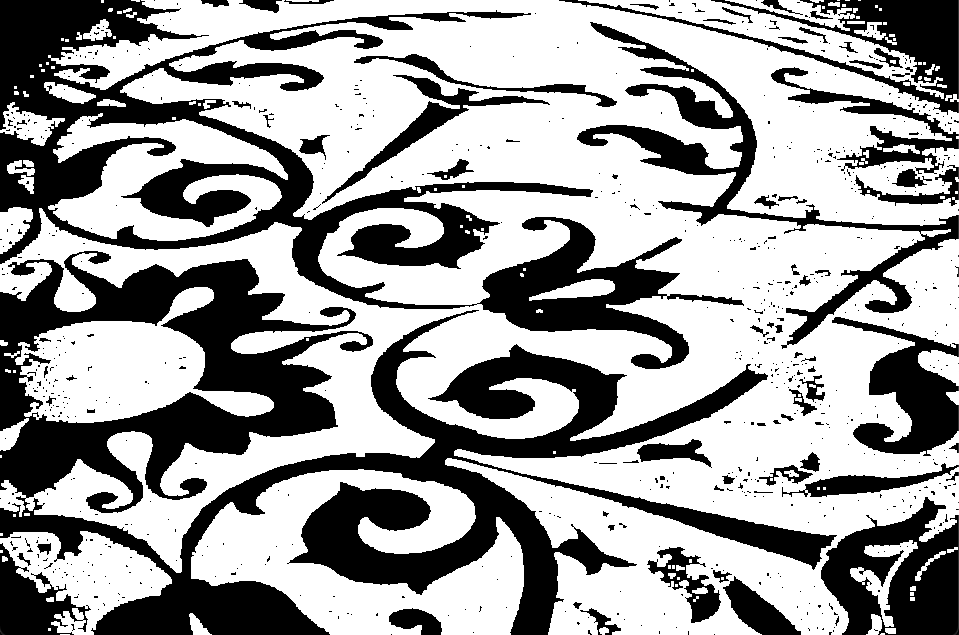

#### floor e

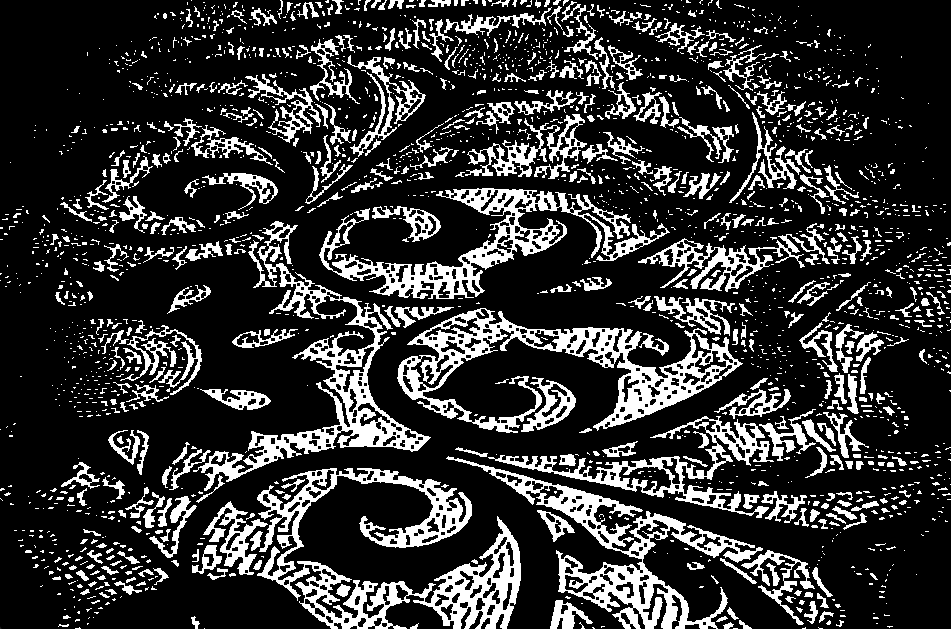

#### dilate (ディレート)：膨張
- dilate した場合は、白い部分が膨張してくるので線画白で塗りつぶされて幾何学模様だけを抽出させる

#### erode (ヘロド)：収縮
- erode した場合は、白が削られて周りの黒に染められて穴が空いたような画像が抽出される

### 膨張・収縮を組み合わせたモノをオープニング・クロージングという

In [54]:
# クロージング
img_c = cv2.morphologyEx(img_th, cv2.MORPH_CLOSE, kernel)

cv2.imshow("d", img_d)
cv2.imshow("e", img_c)
cv2.waitKey(0)
cv2.destroyAllWindows()
cv2.waitKey(1)

-1

#### floor dilate

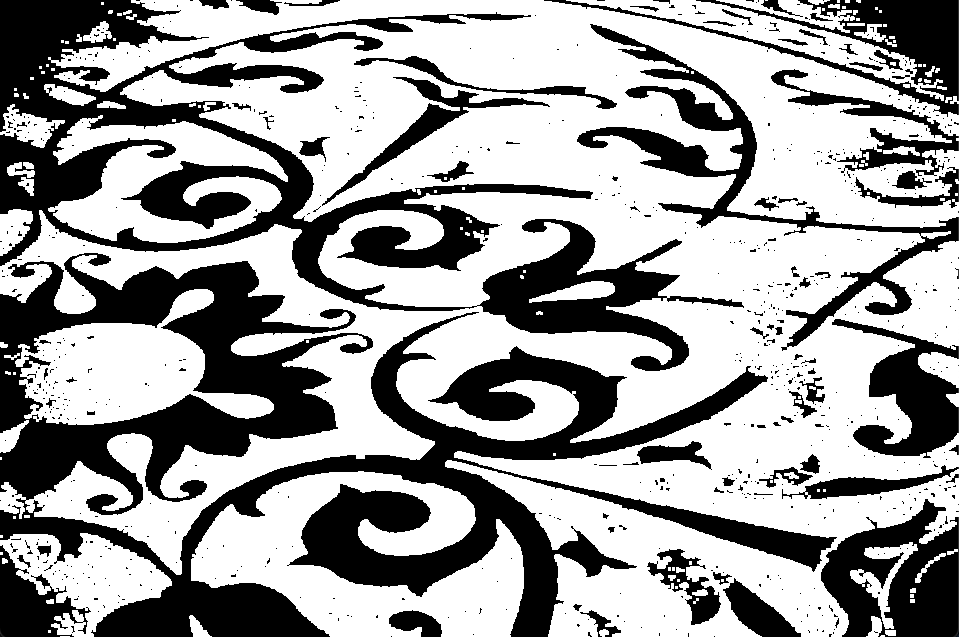

#### floor erode

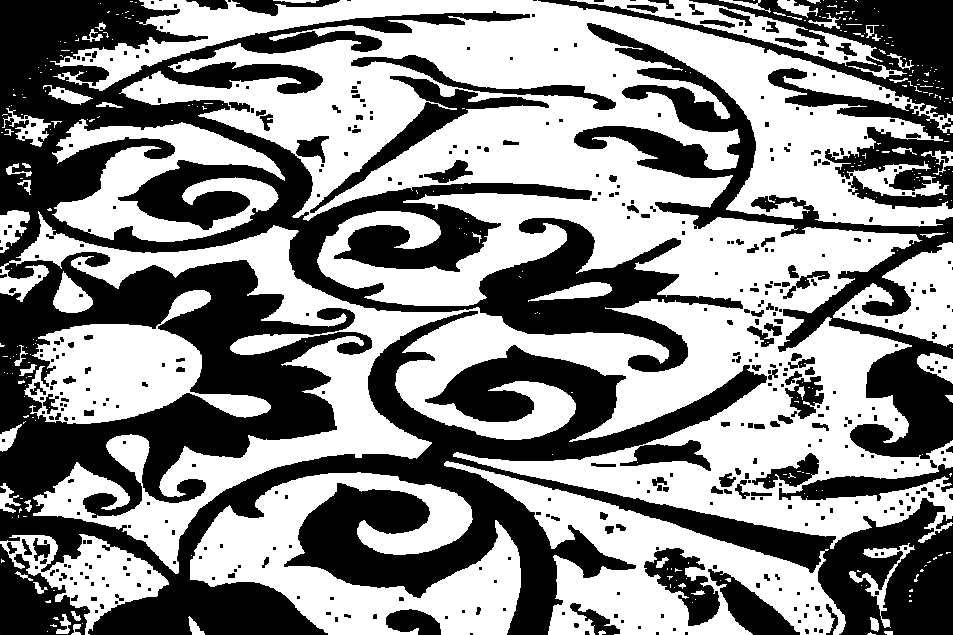

#### クロージング
- 膨張 -> 収縮　
    - 膨張でノイズは消す。その後に収縮して空いた穴を塞ぐので元の形を保ちやすい
    - なるべく元の幾何学的な模様を反映しようと処理する

## インペイント
- 画像の中落書きを消したい時に使用する
    - 落書きの周囲のpixel情報を上手く使用してその落書きを塞いでいく 
- インペイントではマスク画像が必要になる
    - 落書きを塞ぐ(上書きする)画像

In [55]:
import cv2
import numpy as np

In [56]:
img = cv2.imread("data/src/Bus.jpg")
img_mask = cv2.imread("data/src/Mask.jpg", 0)  # グレースケール

In [57]:
cv2.imshow("Mask", img_mask)
cv2.imshow("img", img)
cv2.waitKey(0)
cv2.destroyAllWindows()
cv2.waitKey(1)

-1

#### Bus

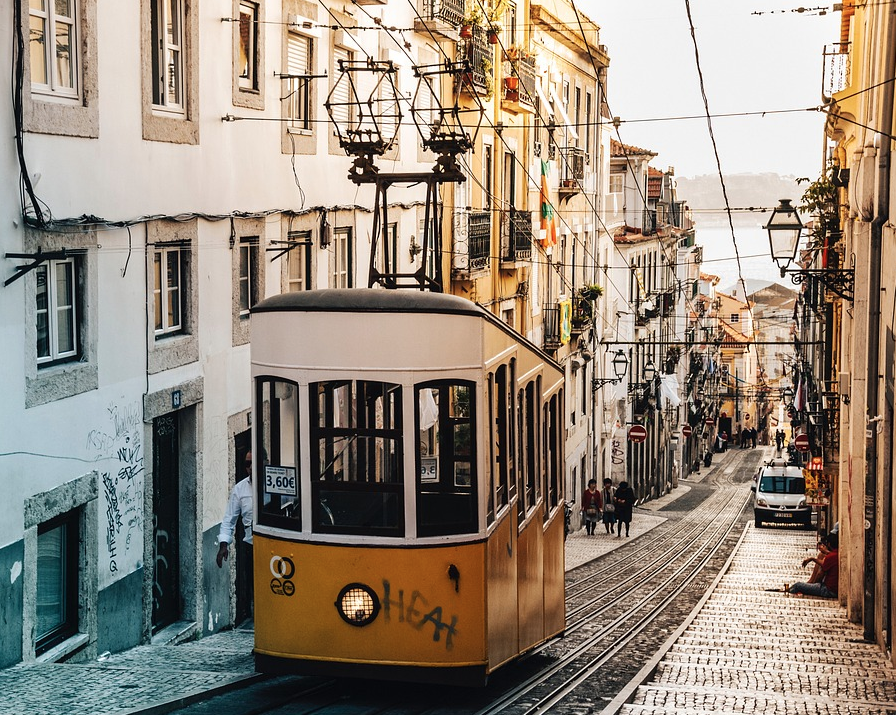

#### Mask

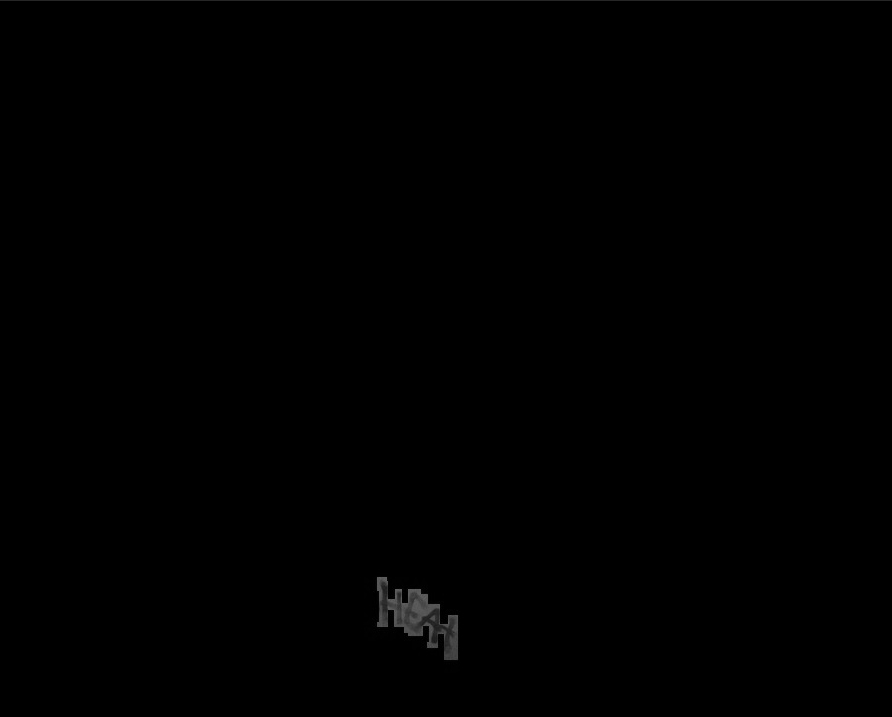

In [58]:
# マスク画像を2値化する
thresh = 1
ret, img_bin = cv2.threshold(img_mask, thresh, 255, cv2.THRESH_BINARY)
cv2.imshow("img", img_bin)
cv2.waitKey(0)
cv2.destroyAllWindows()
cv2.waitKey(1)

-1

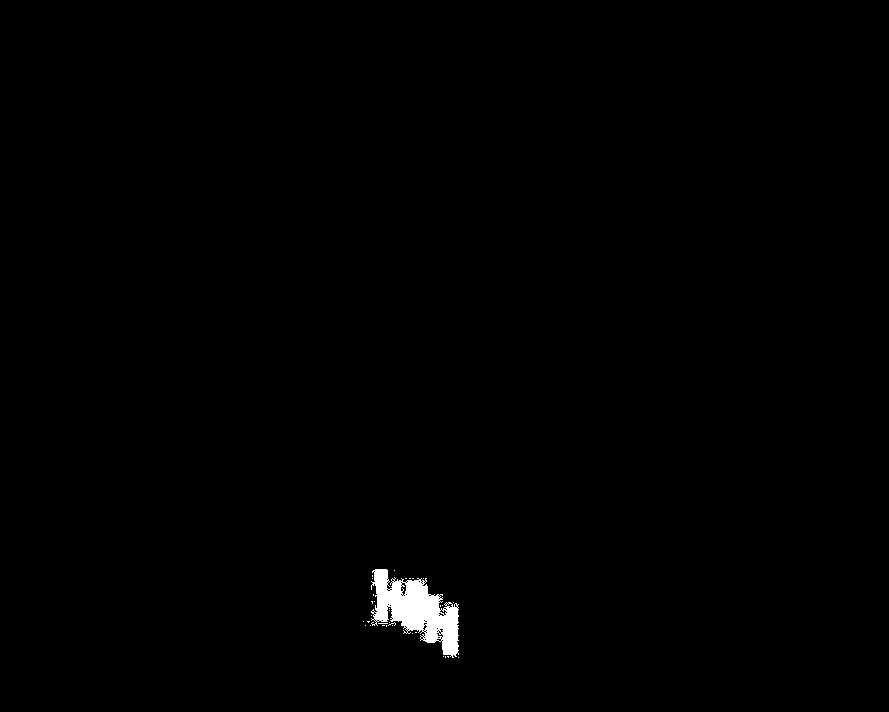

- bainary(バイナリー)の画像になる
    - 画素が入っているところだけを上手くインペイントを使用して修正する

In [59]:
# inpaint(インペイント)する / 修復する画像 : マスク画像 : どれくらいの情報を取り込むか : 手法
img_dst = cv2.inpaint(img, img_bin, 3, cv2.INPAINT_NS)
cv2.imshow("img", img)
cv2.imshow("inpaint", img_dst)
cv2.waitKey(0)
cv2.destroyAllWindows()
cv2.waitKey(1)

-1

- マスク画像を使用して落書きを消すことができる
    - マスクの部分を徐々に周りの色に馴染むように置き換えていく処理を行なっている　 = inpaint(インペイント)

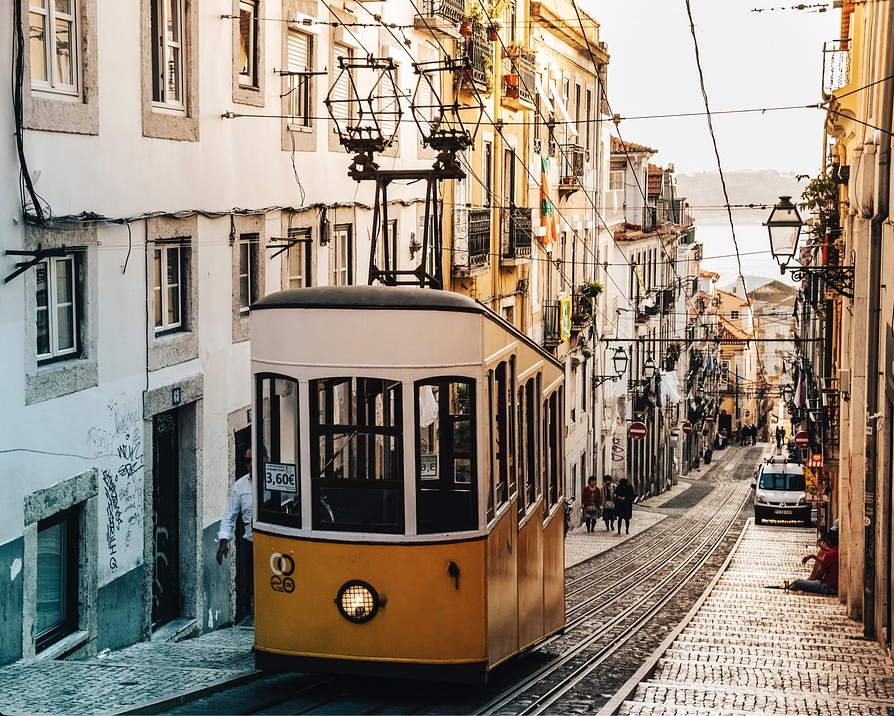